<a href="https://colab.research.google.com/github/miriam-dong/FLIP00/blob/develop/Bike_Sharing_Demand.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Bike Sharing Demand

In [254]:
import numpy as np
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns

In [255]:
train=pd.read_csv('D:/Users/huawei/Documents/GitHub/FLIP00/Data/train.csv',header=0,parse_dates = ['datetime'])
test=pd.read_csv('D:/Users/huawei/Documents/GitHub/FLIP00/Data/test.csv',header=0,parse_dates = ['datetime'])

train.head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
0,2011-01-01 00:00:00,1,0,0,1,9.84,14.395,81,0.0,3,13,16
1,2011-01-01 01:00:00,1,0,0,1,9.02,13.635,80,0.0,8,32,40
2,2011-01-01 02:00:00,1,0,0,1,9.02,13.635,80,0.0,5,27,32
3,2011-01-01 03:00:00,1,0,0,1,9.84,14.395,75,0.0,3,10,13
4,2011-01-01 04:00:00,1,0,0,1,9.84,14.395,75,0.0,0,1,1


In [256]:
print("train:",train.shape)
print("test:",test.shape)

train: (10886, 12)
test: (6493, 9)


In [257]:
print(train.info())
print(test.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10886 entries, 0 to 10885
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   datetime    10886 non-null  datetime64[ns]
 1   season      10886 non-null  int64         
 2   holiday     10886 non-null  int64         
 3   workingday  10886 non-null  int64         
 4   weather     10886 non-null  int64         
 5   temp        10886 non-null  float64       
 6   atemp       10886 non-null  float64       
 7   humidity    10886 non-null  int64         
 8   windspeed   10886 non-null  float64       
 9   casual      10886 non-null  int64         
 10  registered  10886 non-null  int64         
 11  count       10886 non-null  int64         
dtypes: datetime64[ns](1), float64(3), int64(8)
memory usage: 1020.7 KB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6493 entries, 0 to 6492
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dty

In [258]:
train.describe()

,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
count,10886.000000,10886.000000,10886.000000,10886.000000,10886.00000,10886.000000,10886.000000,10886.000000,10886.000000,10886.000000,10886.000000
mean,2.506614,0.028569,0.680875,1.418427,20.23086,23.655084,61.886460,12.799395,36.021955,155.552177,191.574132
std,1.116174,0.166599,0.466159,0.633839,7.79159,8.474601,19.245033,8.164537,49.960477,151.039033,181.144454
min,1.000000,0.000000,0.000000,1.000000,0.82000,0.760000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,2.000000,0.000000,0.000000,1.000000,13.94000,16.665000,47.000000,7.001500,4.000000,36.000000,42.000000
50%,3.000000,0.000000,1.000000,1.000000,20.50000,24.240000,62.000000,12.998000,17.000000,118.000000,145.000000
75%,4.000000,0.000000,1.000000,2.000000,26.24000,31.060000,77.000000,16.997900,49.000000,222.000000,284.000000
max,4.000000,1.000000,1.000000,4.000000,41.00000,45.455000,100.000000,56.996900,367.000000,886.000000,977.000000


In [259]:
import seaborn as sns
#colors = ["windows blue", "amber", "greyish", "faded green", "dusty purple"]
sns.set_palette("Paired", 8)
#sns.set_palette(sns.xkcd_palette(colors), 8)

Text(0.5, 1.0, 'Overview of the Number of Total Rentals Per Hour')

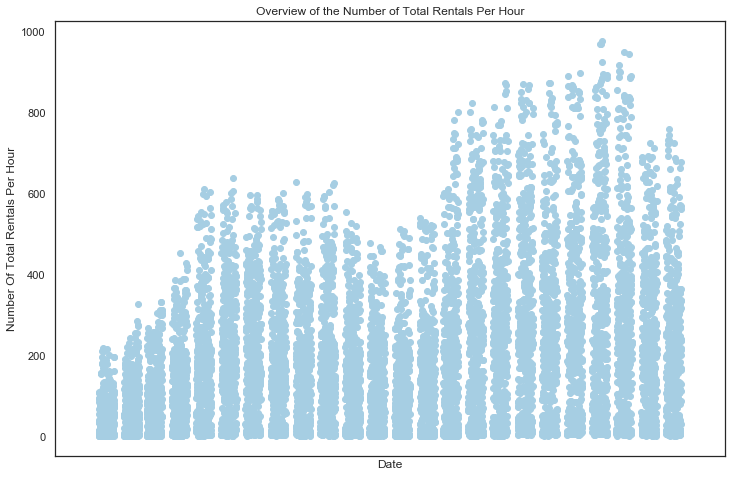

In [260]:
plt.figure(figsize=(12,8))
plt.scatter(train['datetime'],train['count'],label='count')
plt.xlabel('Date')
plt.ylabel('Number Of Total Rentals Per Hour')
plt.xticks([])
plt.title('Overview of the Number of Total Rentals Per Hour')

Text(0.5, 1.0, 'Frequency of the Number of Total Rentals Per Hour')

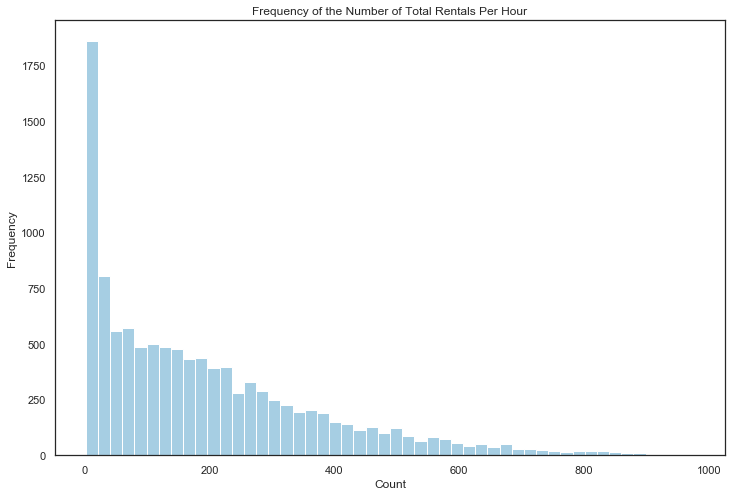

In [261]:
plt.figure(figsize=(12,8))
plt.hist(train['count'],label='count',bins=50)
plt.xlabel('Count')
plt.ylabel('Frequency')
plt.title('Frequency of the Number of Total Rentals Per Hour')

In [262]:
EDA=pd.DataFrame()
EDA['count']=train['count']
EDA['Date']=train.datetime.dt.date
EDA['Year']=train.datetime.dt.year
EDA['Month']=train.datetime.dt.month
EDA['Week']=train.datetime.dt.weekday
EDA['Hour']=train.datetime.dt.hour

seasonDict={1:'Spring',2:'Summer',3:'Fall',4:'Winter'}
EDA['season']=train['season'].map(seasonDict)
monthDict = {1:"January",2:"February",3:"March",4:"April",5:"May",6:"June",7:"July",8:"August",9:"September",10:"October",11:"November",12:"December"}
EDA['Month']=EDA['Month'].map(monthDict)
weekDict = {0:"Sunday",1:"Monday",2:"Tuesday",3:"Wednesday",4:"Thursday",5:"Friday",6:"Saturday"}
EDA['Week']=EDA['Week'].map(weekDict)
weatherDict={1:'Clear',2:'Cloudy',3:'Light Snow',4:'Heavy Rain'}
EDA['Weather']=train['weather'].map(weatherDict)
holidayDict={0:'non holiday',1:'holiday'}
EDA['Holiday']=train['holiday'].map(holidayDict)
workingdayDict={0:'weekend',1:'workday'}
EDA['Workingday']=train['workingday'].map(workingdayDict)

EDA.head()


,count,Date,Year,Month,Week,Hour,season,Weather,Holiday,Workingday
0,16,2011-01-01,2011,January,Friday,0,Spring,Clear,non holiday,weekend
1,40,2011-01-01,2011,January,Friday,1,Spring,Clear,non holiday,weekend
2,32,2011-01-01,2011,January,Friday,2,Spring,Clear,non holiday,weekend
3,13,2011-01-01,2011,January,Friday,3,Spring,Clear,non holiday,weekend
4,1,2011-01-01,2011,January,Friday,4,Spring,Clear,non holiday,weekend


Visualization of the relationship between bike rental number and time

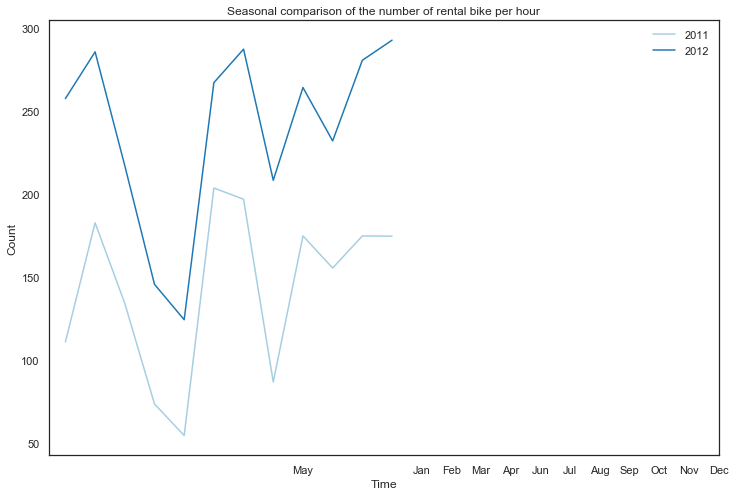

In [263]:
EDA_year=EDA.groupby(['Month','Year']).mean().unstack()['count']

plt.figure(figsize=(12,8))
plt.plot(EDA_year)
plt.xlabel('Time')
plt.ylabel('Count')
plt.title('Seasonal comparison of the number of rental bike per hour')
plt.legend(EDA['Year'].unique(),loc=0,frameon=False)
plt.xticks( ['Jan', 'Feb', 'Mar', 'Apr','May','Jun', 'Jul', 'Aug','Sep', 'Oct', 'Nov', 'Dec'])
#plt.savefig('season.jpg')
plt.show()

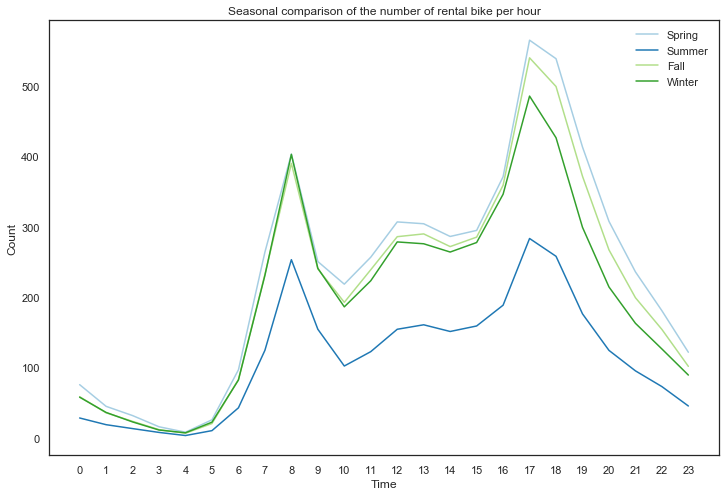

In [264]:
EDA_season=EDA.groupby(['Hour','season']).mean().unstack()['count']

plt.figure(figsize=(12,8))
plt.plot(EDA_season)
plt.xlabel('Time')
plt.ylabel('Count')
plt.title('Seasonal comparison of the number of rental bike per hour')
plt.legend(EDA['season'].unique(),loc=0,frameon=False)
plt.xticks( np.arange(24) )
#plt.savefig('season.jpg')
plt.show()

从上图我们可以看出，春天的使用量明显偏少，可能是温度较低的原因，同时，早上八点和晚上5点左右使用较多

As can be seen from the above diagram, the usage is obviously lower in spring, probably due to the lower temperature. Meanwhile, the usage is higher around 8 am and 5 PM

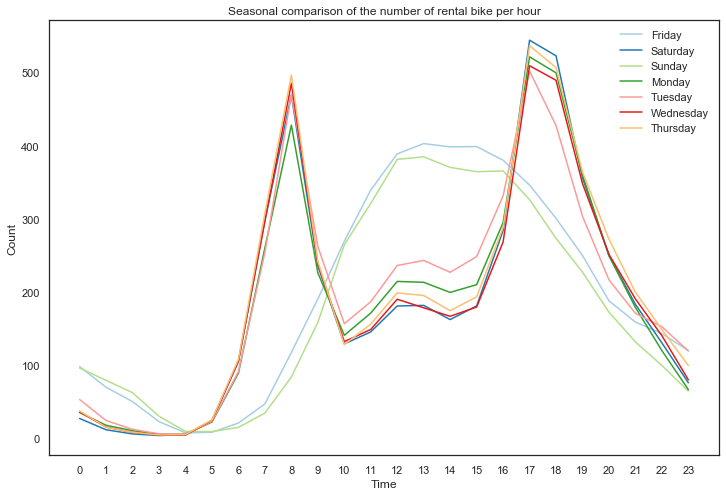

In [265]:
EDA_week=EDA.groupby(['Hour','Week']).mean().unstack()['count']

plt.figure(figsize=(12,8))
plt.plot(EDA_week)
plt.xlabel('Time')
plt.ylabel('Count')
plt.title('Seasonal comparison of the number of rental bike per hour')
plt.legend(EDA['Week'].unique(),loc=0,frameon=False)
plt.xticks( np.arange(24) )
#plt.savefig('week.jpg')
plt.show()

从上图我们可以看出，周一到周五中，一天中早上8-9点和下午5-7点，使用量比较多，可能是早上上班时间和晚上下班时间导致的，同时包含外出吃饭的原因，而对于周末，时间比较集中，基本在11点到下午5点左右使用量比较多，这个时间估计是大家的休闲时间。

From above we can see, from Monday to Friday, 8 in the morning of the day - 9 am and 5 to 7 PM, usage is more, may be caused by time going to work in the morning and evening after work time, include the reason of eating out at the same time, for the weekend, time is more focused, basic usage around 11 PM to 5 PM,
This time is supposed to be everyone's leisure time.

No handles with labels found to put in legend.


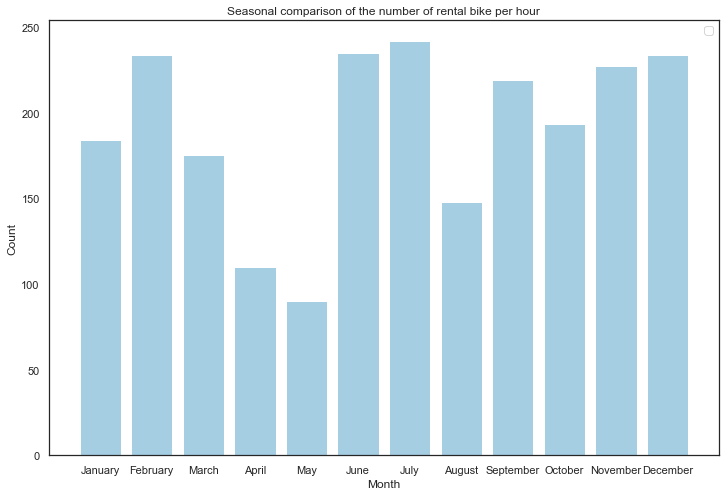

In [266]:
EDA_month=EDA.groupby('Month')['count'].mean()

plt.figure(figsize=(12,8))
plt.bar(x=EDA['Month'].unique(),height=EDA_month)
plt.xlabel('Month')
plt.ylabel('Count')
plt.title('Seasonal comparison of the number of rental bike per hour')
plt.legend()
#plt.savefig('hol.jpg')
plt.show()

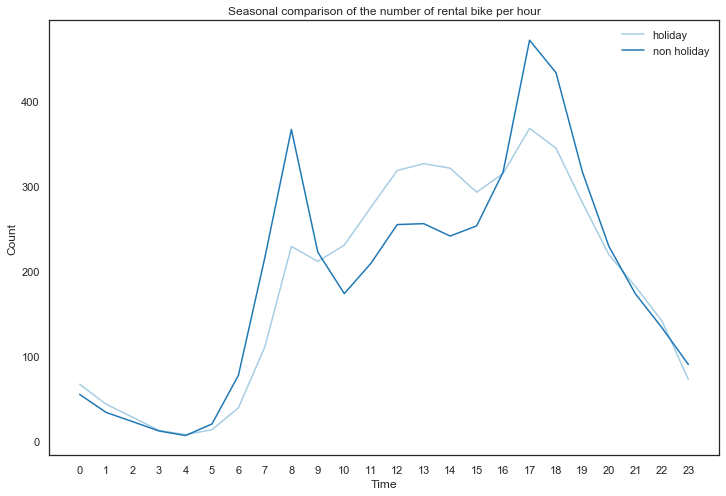

In [267]:
EDA_holiday = EDA.groupby(['Hour', 'Holiday']).mean().unstack()['count']

plt.figure(figsize=(12,8))
plt.plot(EDA_holiday)
plt.xlabel('Time')
plt.ylabel('Count')
plt.title('Seasonal comparison of the number of rental bike per hour')
plt.legend(list(EDA_holiday),loc=0,frameon=False)
plt.xticks( np.arange(24) )
#plt.savefig('hol.jpg')
plt.show()




节假日和非节假日使用时间比较接近，但是节假日使用明显高于非节假日。

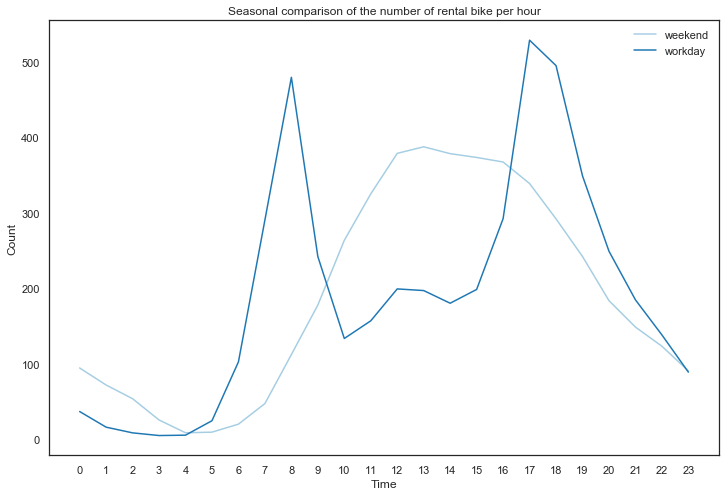

In [268]:
EDA_workingday = EDA.groupby(['Hour', 'Workingday']).mean().unstack()['count']

plt.figure(figsize=(12,8))
plt.plot(EDA_workingday)
plt.xlabel('Time')
plt.ylabel('Count')
plt.title('Seasonal comparison of the number of rental bike per hour')
plt.legend(list(EDA_workingday),loc=0,frameon=False)
plt.xticks( np.arange(24) )
#plt.savefig('hol.jpg')
plt.show()


明显可以看到，周末和工作日，单车的使用主要集中在不同时间

The influence of temperature, humidity and demeanor on the number of shared bike rentals

D:\Program Files\Anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
D:\Program Files\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]


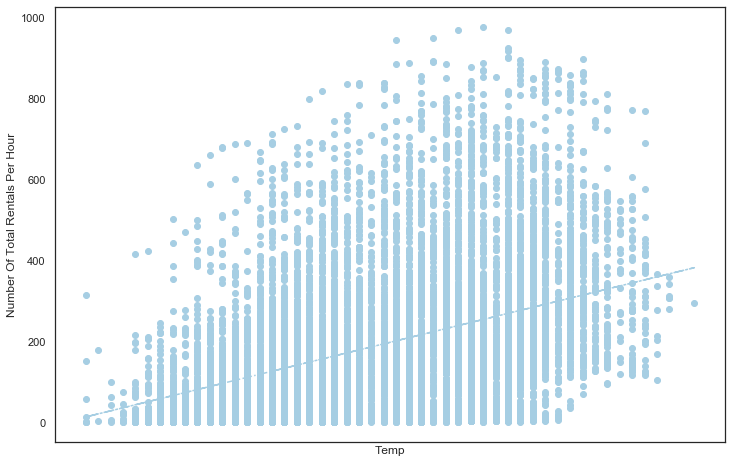

In [269]:
#Temperature
plt.figure(figsize=(12,8))
plt.scatter(x="temp", y="count", data=train)
plt.xlabel('Temp')
plt.ylabel('Number Of Total Rentals Per Hour')
plt.xticks([])
#plt.title('Overview of the Number of Total Rentals Per Hour')
poly = np.polyfit(train['temp'], train['count'], 1)
z=np.polyval(poly, train['temp'])
plt.plot(train['temp'], z, '-.')
plt.show()

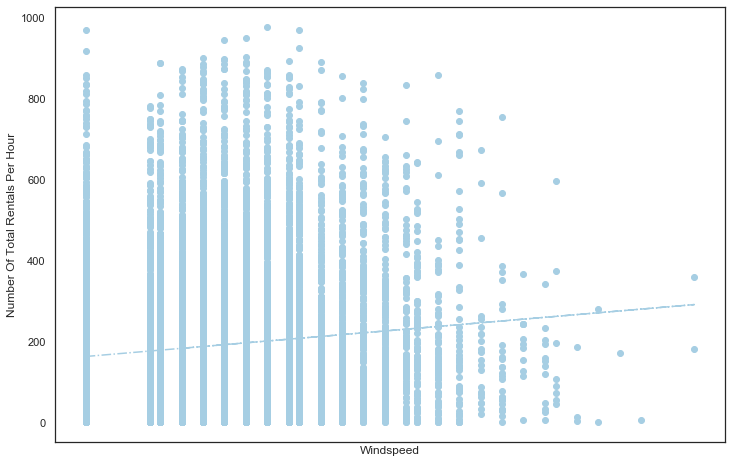

In [270]:
#Windspeed
plt.figure(figsize=(12,8))
plt.scatter(x="windspeed", y="count", data=train)
plt.xlabel('Windspeed')
plt.ylabel('Number Of Total Rentals Per Hour')
plt.xticks([])
#plt.title('Overview of the Number of Total Rentals Per Hour')
poly = np.polyfit(train['windspeed'], train['count'], 1)
z=np.polyval(poly, train['windspeed'])
plt.plot(train['windspeed'], z, '-.')
plt.show()

Text(0, 0.5, 'count')

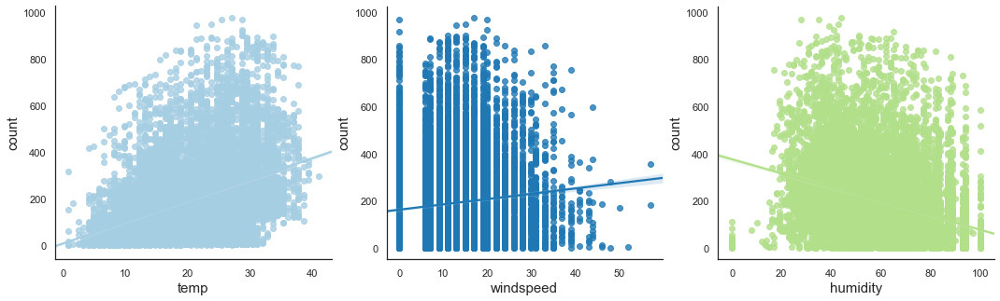

In [271]:

fig,(ax1,ax2,ax3) = plt.subplots(ncols=3)
fig.set_size_inches(18, 5)
sns.set(style='white')
sns.despine()
ax1=sns.regplot(x="temp", y="count", data=train,ax=ax1)
ax2=sns.regplot(x="windspeed", y="count", data=train,ax=ax2)
ax3=sns.regplot(x="humidity", y="count", data=train,ax=ax3)

#ax1.set(xlabel='temp',ylabel='count')
ax1.set_xlabel('temp',fontsize=15)
ax1.set_ylabel('count',fontsize=15)
ax2.set_xlabel('windspeed',fontsize=15)
ax2.set_ylabel('count',fontsize=15)
ax3.set_xlabel('humidity',fontsize=15)
ax3.set_ylabel('count',fontsize=15)


气温低于10，高于30度，租车人数较少-太冷太热都会抑制租车需求

风速越大，租车人数越少-大风抑制租车需求

空气湿度越高，租车人数越少-干爽的天气骑车比较舒适

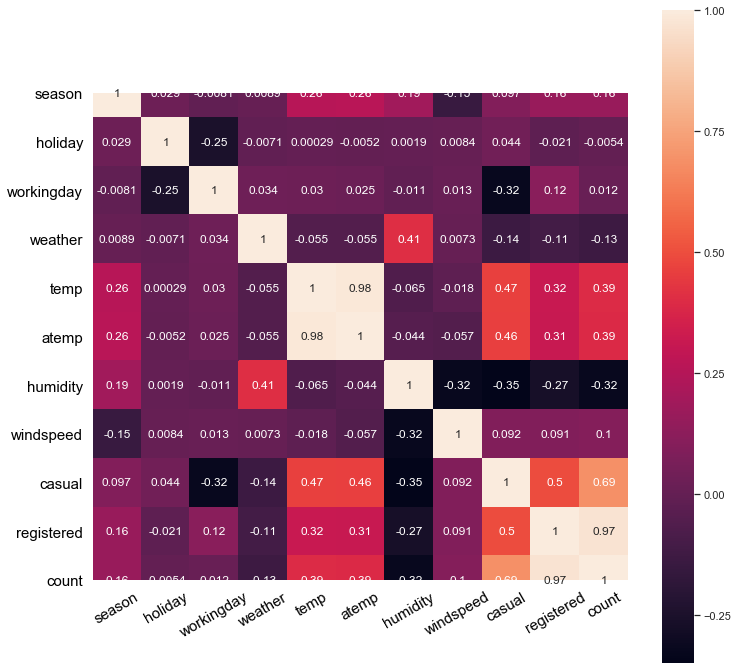

In [272]:
cor=train.corr()

fig=plt.figure(figsize=(12,12))
sns.set(style='white')
sns.heatmap(cor,vmax=1,square=True,annot=True)
plt.xticks(fontsize=15,color='black',rotation=30)
plt.yticks(fontsize=15,color='black')
#plt.savefig('test2.jpg')
plt.show()

In [273]:
cor['count'].sort_values(ascending=False)

count         1.000000
registered    0.970948
casual        0.690414
temp          0.394454
atemp         0.389784
season        0.163439
windspeed     0.101369
workingday    0.011594
holiday      -0.005393
weather      -0.128655
humidity     -0.317371
Name: count, dtype: float64

Models

In [274]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_log_error
from sklearn.preprocessing import StandardScaler,MinMaxScaler

X = train.drop(['count','datetime','registered','casual'],axis=1)
y = train['count']


sc = MinMaxScaler()
X = sc.fit_transform(X)

X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.2,random_state = 42)

LinearRegression

In [275]:
from sklearn.linear_model import LinearRegression

lr = LinearRegression()
lr.fit(X_train, y_train)
lr_y_predict = lr.predict(X_test)

# checking the rmsle，accuracy
lr_rmsle=np.sqrt(mean_squared_log_error(y_test,lr_y_predict))


print('LinearRegression RMSLE is ',lr_rmsle)


ValueError: Mean Squared Logarithmic Error cannot be used when targets contain negative values.

SGDRegressor

In [204]:
from sklearn.linear_model import SGDRegressor

sgdr = SGDRegressor()
sgdr.fit(X_train, y_train)
sgdr_y_predict = sgdr.predict(X_test)

# checking the rmsle
sgdr_rmsle=np.sqrt(mean_squared_log_error(y_test,sgdr_y_predict))


print('SGDRegressor RMSLE is ',sgdr_rmsle)


SGDRegressor RMSLE is  0.03521303735243047


SVR model

In [205]:
from sklearn.svm import SVR

#SVR with linear kernel function
linear_svr = SVR(kernel='linear')
linear_svr.fit(X_train, y_train)
linear_svr_y_predict = linear_svr.predict(X_test)

# checking the rmsle
linear_svr_rmsle=np.sqrt(mean_squared_log_error(y_test,linear_svr_y_predict))
#linear_svr_acc = accuracy_score(y_test,linear_svr_y_predict)
print('Linear SVR RMSLE is ',linear_svr_rmsle)
#print('Linear SVR Accuracy is ',linear_svr_acc)

# SVR with poly kernel function
poly_svr = SVR(kernel='poly')
poly_svr.fit(X_train, y_train)
poly_svr_y_predict = poly_svr.predict(X_test)

# checking the rmsle
poly_svr_rmsle=np.sqrt(mean_squared_log_error(y_test,poly_svr_y_predict))
#poly_svr_acc = accuracy_score(y_test,poly_svr_y_predict)
print('Poly SVR RMSLE is ',poly_svr_rmsle)
#print('Poly SVR Accuracy is ',poly_svr_acc)

# SVR with rbf kernel function
rbf_svr = SVR(kernel='rbf')
rbf_svr.fit(X_train, y_train)
rbf_svr_y_predict = rbf_svr.predict(X_test)

# checking the rmsle
rbf_svr_rmsle=np.sqrt(mean_squared_log_error(y_test,rbf_svr_y_predict))
#rbf_svr_acc = accuracy_score(y_test,rbf_svr_y_predict)
print('RBF SVR RMSLE is ',rbf_svr_rmsle)
#print('RBF SVR Accuracy is ',rbf_svr_acc)


D:\Program Files\Anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
Linear SVR RMSLE is  0.01769608032108037
Poly SVR RMSLE is  1.4624000999313127
D:\Program Files\Anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
RBF SVR RMSLE is  1.1946816823336224


KNeighborsRegressor

In [206]:
from sklearn.neighbors import KNeighborsRegressor

uni_knr = KNeighborsRegressor(weights='uniform')
uni_knr.fit(X_train, y_train)
uni_knr_y_predict = uni_knr.predict(X_test)

# checking the rmsle
uni_knr_rmsle=np.sqrt(mean_squared_log_error(y_test,uni_knr_y_predict))
#uni_svr_acc = accuracy_score(y_test,uni_svr_y_predict)
print('Uniform KNeighborsRegressor RMSLE is ',uni_knr_rmsle)
#print('Uniform KNeighborsRegressor Accuracy is ',uni_svr_acc)

dis_knr = KNeighborsRegressor(weights='distance')
dis_knr.fit(X_train, y_train)
dis_knr_y_predict = dis_knr.predict(X_test)

# checking the rmsle
dis_knr_rmsle=np.sqrt(mean_squared_log_error(y_test,dis_knr_y_predict))
#dis_svr_acc = accuracy_score(y_test,dis_svr_y_predict)
print('Distance KNeighborsRegressor RMSLE is ',dis_knr_rmsle)
#print('Distance KNeighborsRegressor Accuracy is ',dis_svr_acc)

Uniform KNeighborsRegressor RMSLE is  0.5749865404518771
Distance KNeighborsRegressor RMSLE is  0.5226288740569272


DecisionTreeRegressor

In [207]:
from sklearn.tree import DecisionTreeRegressor

dtr = DecisionTreeRegressor()
dtr.fit(X_train, y_train)
dtr_y_predict = dtr.predict(X_test)

# checking the rmsle
dtr_rmsle=np.sqrt(mean_squared_log_error(y_test,dtr_y_predict))
#dtr_acc = accuracy_score(y_test,dtr_y_predict)
print('DecisionTreeRegressor RMSLE is ',dtr_rmsle)
#print('DecisionTreeRegressor Accuracy is ',dtr_acc)

DecisionTreeRegressor RMSLE is  0.019478724212585445


RandomForestRegressor

In [208]:
from sklearn.ensemble import RandomForestRegressor

rfr = RandomForestRegressor()
rfr.fit(X_train, y_train)
rfr_y_predict = rfr.predict(X_test)

# checking the rmsle
rfr_rmsle=np.sqrt(mean_squared_log_error(y_test,rfr_y_predict))
#rfr_acc = accuracy_score(y_test,rfr_y_predict)
print('RandomForestRegressor RMSLE is ',rfr_rmsle)
#print('RandomForestRegressor Accuracy is ',rfr_acc)

D:\Program Files\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
RandomForestRegressor RMSLE is  0.015997648966966104


ExtraTreesRegressor

In [209]:
from sklearn.ensemble import ExtraTreesRegressor

etr = ExtraTreesRegressor()
etr.fit(X_train, y_train)
etr_y_predict = etr.predict(X_test)

# checking the rmsle
etr_rmsle=np.sqrt(mean_squared_log_error(y_test,etr_y_predict))
#etr_acc = accuracy_score(y_test,etr_y_predict)
print('ExtraTreesRegressor RMSLE is ',etr_rmsle)
#print('ExtraTreesRegressor Accuracy is ',etr_acc)

ExtraTreesRegressor RMSLE is  0.010903274146915868
D:\Program Files\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


GradientBoostingRegressor

In [210]:
from sklearn.ensemble import GradientBoostingRegressor

gbr = GradientBoostingRegressor()
gbr.fit(X_train, y_train)
gbr_y_predict = gbr.predict(X_test)

# checking the rmsle
gbr_rmsle=np.sqrt(mean_squared_log_error(y_test,gbr_y_predict))
#gbr_acc = accuracy_score(y_test,gbr_y_predict)
print('GradientBoostingRegressor RMSLE is ',gbr_rmsle)
#print('GradientBoostingRegressor Accuracy is ',gbr_acc)

GradientBoostingRegressor RMSLE is  0.05507132297615649


In [228]:
df_RMSLE=pd.DataFrame(columns=['Models', 'RMSLE'],
data=[['LR',lr_rmsle],['SGDR',sgdr_rmsle],
['Linear SVR',linear_svr_rmsle],['Poly SVR',poly_svr_rmsle],
['RBF SVR',rbf_svr_rmsle],['Uni KNR',uni_knr_rmsle],
['Dis KNR',dis_knr_rmsle],['DTR',dtr_rmsle],
['RFR',rfr_rmsle],['ETR',etr_rmsle],
['GBR',gbr_rmsle]]
)

df_RMSLE['RMSLE']=df_RMSLE['RMSLE'].round(5)

print(df_RMSLE.sort_values(by='RMSLE'))


        Models    RMSLE
0           LR  0.00000
9          ETR  0.01090
8          RFR  0.01600
2   Linear SVR  0.01770
7          DTR  0.01948
1         SGDR  0.03521
10         GBR  0.05507
6      Dis KNR  0.52263
5      Uni KNR  0.57499
4      RBF SVR  1.19468
3     Poly SVR  1.46240


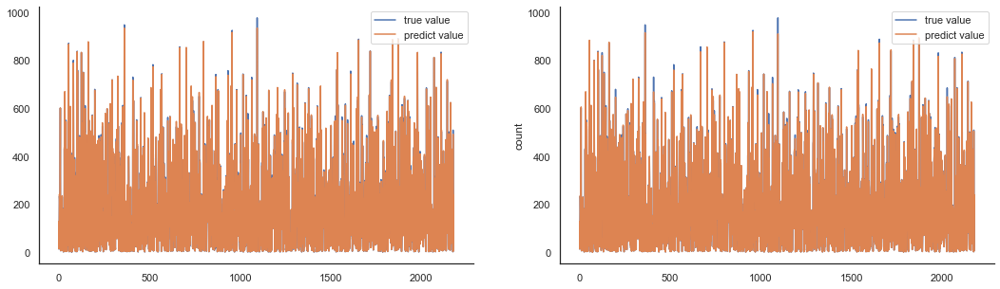

In [227]:
fig,(ax1,ax2) = plt.subplots(ncols=2)
fig.set_size_inches(18, 5)
sns.set(style='white')
sns.despine()
ax1=sns.lineplot(np.arange(len(y_test)),y_test.values,label = 'true value',ax=ax1)
ax1=sns.lineplot(np.arange(len(y_test)),gbr_y_predict,label = 'predict value',ax=ax1)
ax2=sns.lineplot(np.arange(len(y_test)),y_test,label = 'true value',ax=ax2)
ax2=sns.lineplot(np.arange(len(y_test)),rfr_y_predict,label = 'predict value',ax=ax2)

#ax1.set(xlabel='temp',ylabel='count')
#ax1.set_xlabel('temp',fontsize=15)
#ax1.set_ylabel('true value',fontsize=15)
#ax2.set_xlabel('windspeed',fontsize=15)
#ax2.set_ylabel('count',fontsize=15)
#ax3.set_xlabel('humidity',fontsize=15)
#ax3.set_ylabel('count',fontsize=15)


In [220]:
dis_knr_y_predict

array([146.16253907,  29.43361121, 136.77076538, ..., 491.42640387,
         6.99623215, 240.99338352])

In [221]:
y_test

3133     127
5786      13
5224     163
8953     233
8054     222
        ... 
1963     351
5807       2
10061    509
5427       5
7588     239
Name: count, Length: 2178, dtype: int64

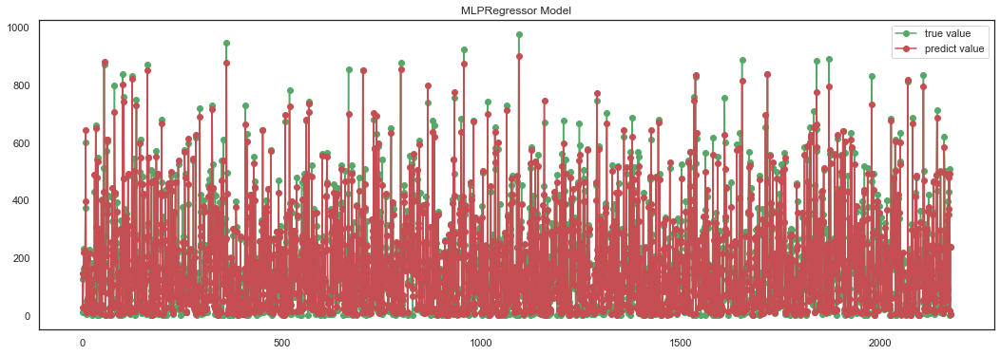

In [224]:
plt.figure(figsize = (18,6))

plt.plot(np.arange(len(y_test)),y_test.values,'go-',label = 'true value')
plt.plot(np.arange(len(y_test)),dis_knr_y_predict,'ro-',label = 'predict value')

plt.title('MLPRegressor Model')
plt.legend()
plt.show()

In [230]:
lr_y_sub = lr.predict(test.drop(['datetime'],axis=1))

ValueError: shapes (6493,8) and (10,) not aligned: 8 (dim 1) != 10 (dim 0)